# Laboratorio proyecto final pds
## Hanna Isabella Colorado Martinez
### C.C:1000408557

In [1]:
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal

 # 1.	  Carga y visualización de la señal
 
 ## 1.1. 
Cargue, normalice y reproduzca una canción de su preferencia, cree el vector tiempo de la señal y extraiga su frecuencia de muestreo; grafique la señal en términos de la amplitud y el tiempo.
(Puede utilizar la función: librosa.util.normalize() consulte que es lo que hace esta función.)


In [2]:
cancion = "Main Theme from Star Wars.mp3"
cancion, Fs = librosa.load(cancion)
# normalizar la señal:
c_normalizada = librosa.util.normalize(cancion) #se utilizará la librería librosa.util.normalize para normalizarla en un rango específico


## 1.2
verifique el rango de normalización de la señal.

In [3]:
#Verificar los rangos de normalización.
rango_min = c_normalizada.min()
rango_max = c_normalizada.max()
print("El rango de amplitud de la canción normalizada es: ", rango_min, " a ", rango_max)

El rango de amplitud de la canción normalizada es:  -0.99115217  a  1.0


Frecuencia de muestreo:  22050


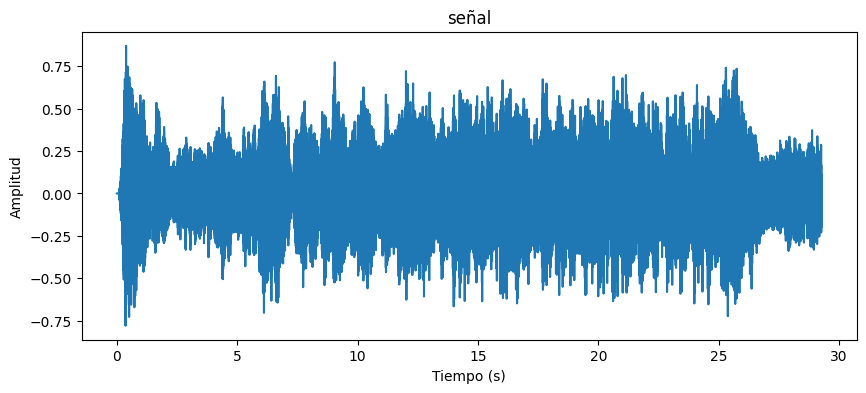

número de muestras:645248


In [4]:
inicio_rang=0
final_rang=645248
duracion_prueba = len(c_normalizada[inicio_rang:final_rang])/Fs
tiempo_prueba = np.linspace(0, duracion_prueba, len(c_normalizada[inicio_rang:final_rang])) #vector tiempo de la señal
plt.figure(figsize=(10, 4))
plt.plot(tiempo_prueba, c_normalizada[inicio_rang:final_rang])
#el tiempo estará en términos de segundos
print("Frecuencia de muestreo: ", Fs)
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title("señal")
plt.show()
n_muestras = len(c_normalizada[inicio_rang:final_rang])
print(f'número de muestras:{n_muestras}')
ipd.Audio(c_normalizada[inicio_rang:final_rang], rate=Fs) #reproducir la canción

## 1.3
Grafique el espectrograma de la señal en un rango de su preferencia, ¿Qué puede interpretar de este?

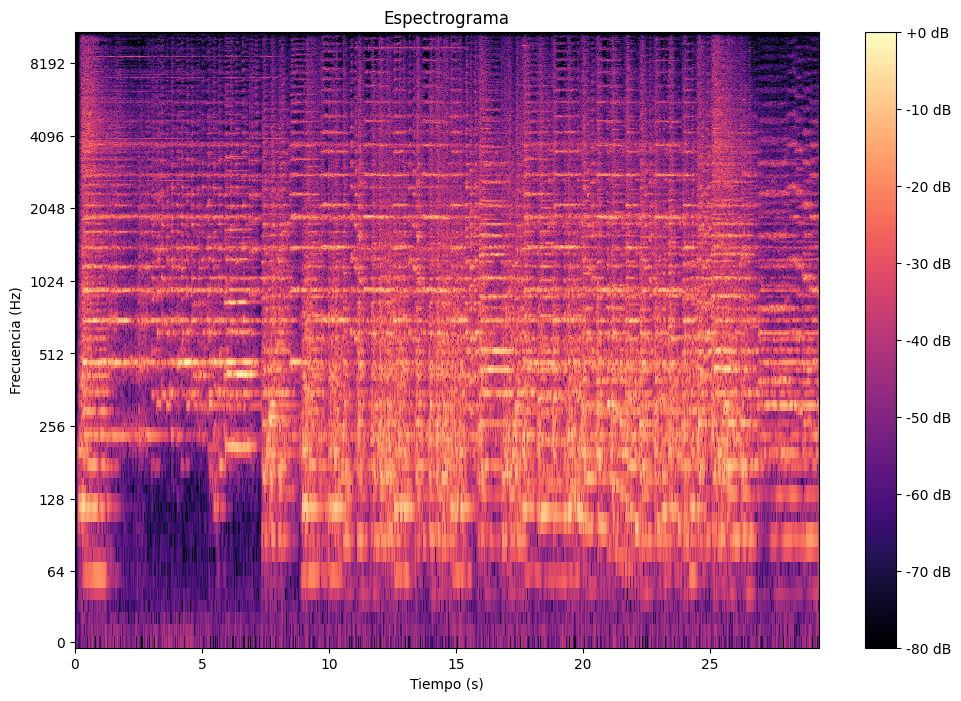

In [5]:
# Calcular espectrograma de la señal
inicio_rang=0
final_rang=645248
espectrograma = librosa.stft(c_normalizada[inicio_rang:final_rang])
espectrograma_db = librosa.amplitude_to_db(np.abs(espectrograma), ref=np.max)
plt.figure(figsize=(12, 8))
librosa.display.specshow(espectrograma_db, sr=Fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.show()

R//: Aquí se debe tener en cuenta la canción o señal que se está graficando, la orquesta que interpretó Star Wars Main Theme usó una gran variedad de instrumentos tales como:
Trompetas, tambores, trombones, flautas, instrumentos de cuerdas, percusión entre otros.
Muchos de estos instrumentos se encuentran en escalas de frecuencia distintas; el espectrograma en cuestión representa señales con intensidades mayores de colores claros, y las mas bajas con colores más oscuros, estos cambios de color entonces representan el cambio en las frecuencias siendo algunos múltiplos de la frecuencia fundamental.

Nota:la forma de interpretar esa barra es: 0dB es la señal de mayor intensidad, y a medida que deciende la señal disminuye.
Podemos considerar -80dB como silencio.

# 2.	Diseño de Filtros con Respuesta Finita al Impulso (FIR) 

In [6]:
import scipy.signal as signal

## 2.1.1.
Diseñe un filtro FIR que funcione como un pasa-bajas por el método de enventanado, con una banda de transición de 300 Hz, una frecuencia de corte de 2KHz y un ripple de 25dB. (Utilice las ventanas: haming, blackman y flattop).

In [7]:
def filtro_fir_windows(señal, fs, Fc, start_f, end_f, ventana='blackman'):
    #para cálcular el orden del filtro
    nyquist_freq = fs / 2 
    transition_width=300  # valor_ancho_banda = ancho_banda_espectral[0] librosa.feature.spectral_bandwidth(S=espectrograma, sr=frecuencia_muestreo)
    #el ancho de banda de esta cancioon dio alrededor de 300
    width = transition_width/nyquist_freq
    #computar el orden y el parametro kaiser para el filtro
    N, beta = signal.kaiserord(ripple=25, width=width) # el riple especifica el factor de atenuacións
    
    if N%2 == 0:
        N = N+1
    
    #diseño del filtro:
    normalized_Fc=Fc/nyquist_freq 
    taps=signal.firwin(N , normalized_Fc, window=ventana)
    
    
    cancion_filtro = signal.convolve(señal[start_f:end_f], taps, mode='same')
    return cancion_filtro, N

In [8]:
#Se ejecuta la función para las tres ventanas
Fc = 2000  # Hz
start= 0
end=645248 #muestras 
window_type = 'hamming'
filtered_signal,r = filtro_fir_windows(c_normalizada, Fs, Fc, start, end, window_type)
window_type2 = 'blackman'
filtered_signal2,r2 = filtro_fir_windows(c_normalizada, Fs, Fc, start, end, window_type2)
window_type3 = 'flattop'
filtered_signal3,r3 = filtro_fir_windows(c_normalizada, Fs, Fc, start, end, window_type3)
print(r2)

89


In [9]:
#  definir función para graficar el espectro de amplitud aplicando transformada rápida de fourier
def plot_spectrum(señal_entrada, fs):
    spectrum = np.fft.fft(señal_entrada)
    freqs = np.fft.fftfreq(len(señal_entrada), 1/fs)
    
    magnitude = np.abs(spectrum)
    phase = np.angle(spectrum)
    
    plt.figure(figsize=(12, 4))
    plt.plot(freqs, magnitude)
    plt.vlines(Fc,0,3000,color='g',lw=2,linestyle='--')
    plt.vlines(-Fc,0,3000,color='g',lw=2,linestyle='--')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud ')
    plt.title('Espectro de Amplitud')
    plt.grid(True)
    plt.show()
    
    plt.figure(figsize=(12, 4))
    plt.plot(freqs, 20 * np.log10(magnitude))
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('amplitud (dB)')
    plt.title('espectro de amplitud en decibeles (dB) ')
    plt.grid(True)
    plt.show()
    
    plt.figure(figsize=(12, 4))
    plt.plot(freqs, magnitude**2)
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Amplitud ')
    plt.title('Espectro de Potencia')
    plt.grid(True)
    plt.show()

## 2.1.2.
Grafique el espectro de amplitud de la señal antes de aplicar el filtro.

Espectro canción sin filtrar


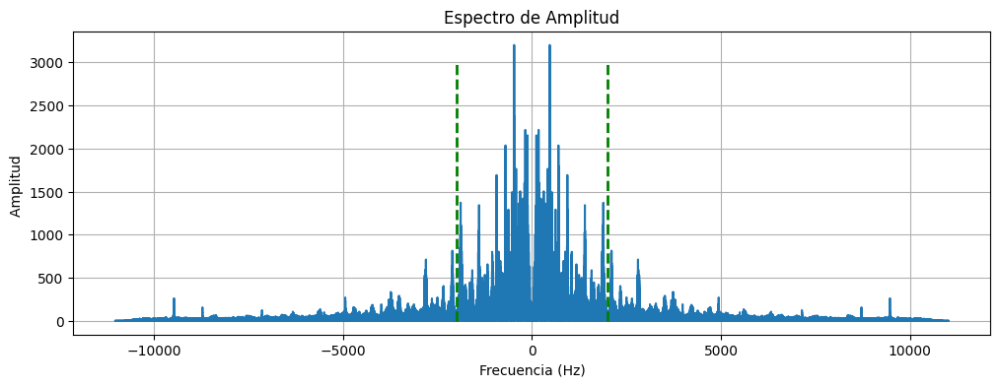

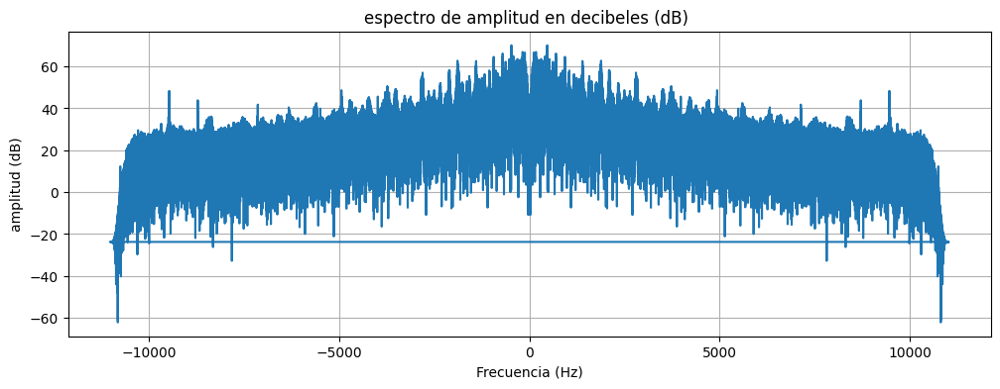

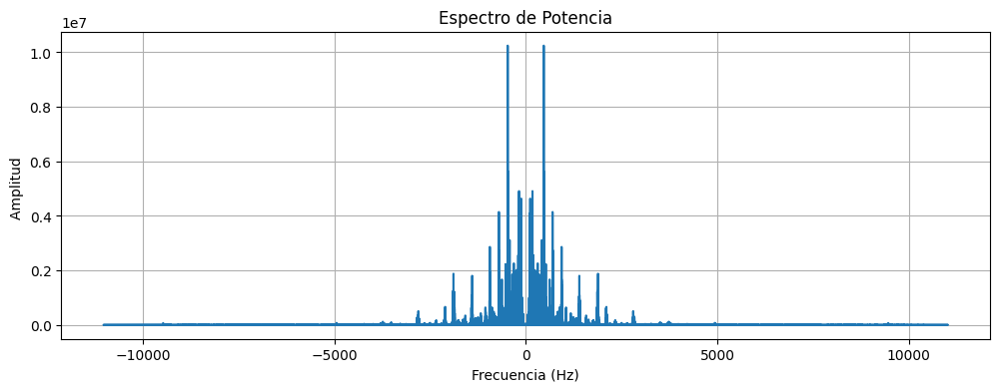

In [10]:
print(f'Espectro canción sin filtrar')
grafiq=plot_spectrum(c_normalizada[inicio_rang:final_rang],Fs)

## 2.1.3.
Grafique el espectro de amplitud de los tres métodos de enventanado anteriormente mencionados aplicando la transformada rápida de Fourier(FFT).

Hamming


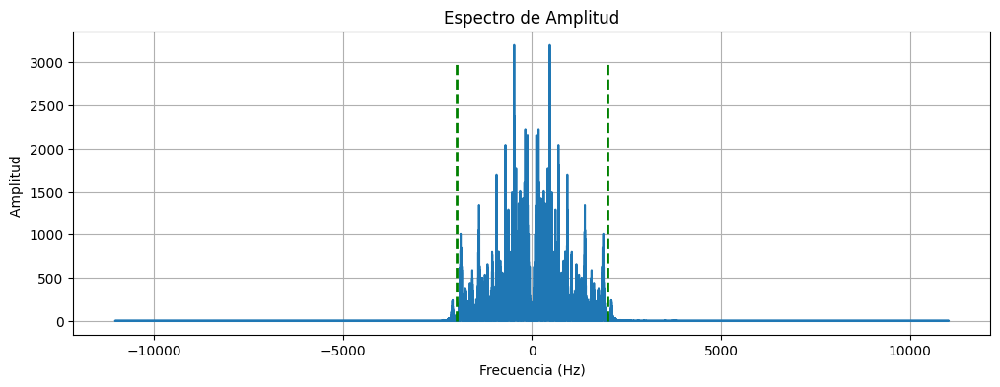

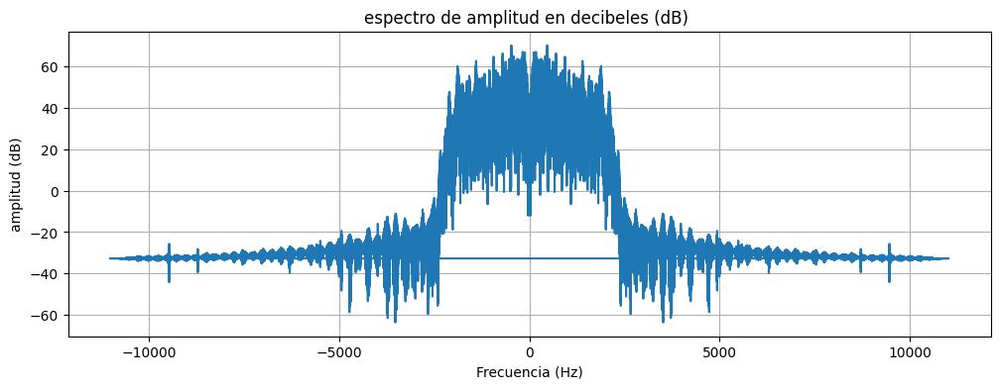

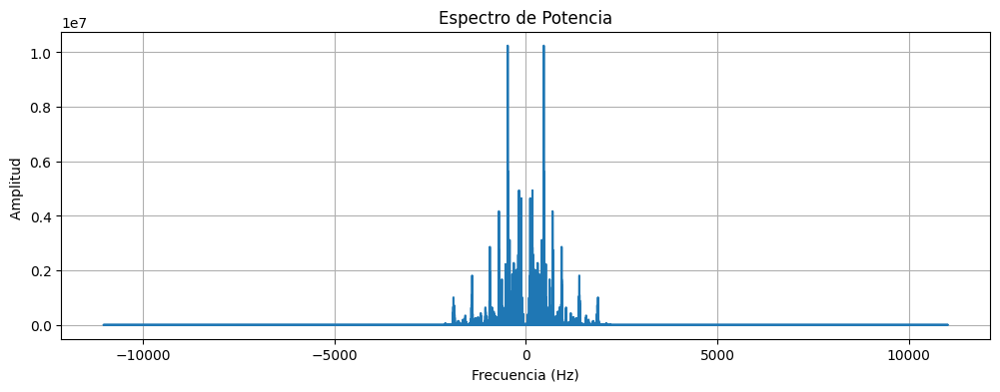

In [11]:
print(f'Hamming')
grafiq=plot_spectrum(filtered_signal,Fs)

blackman


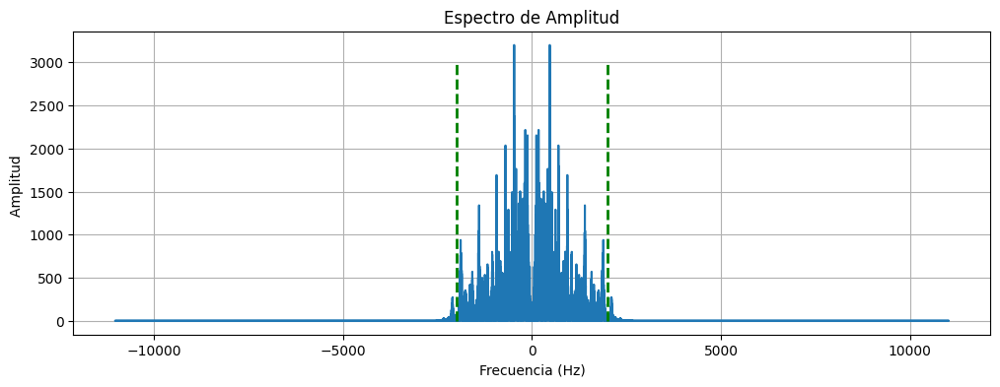

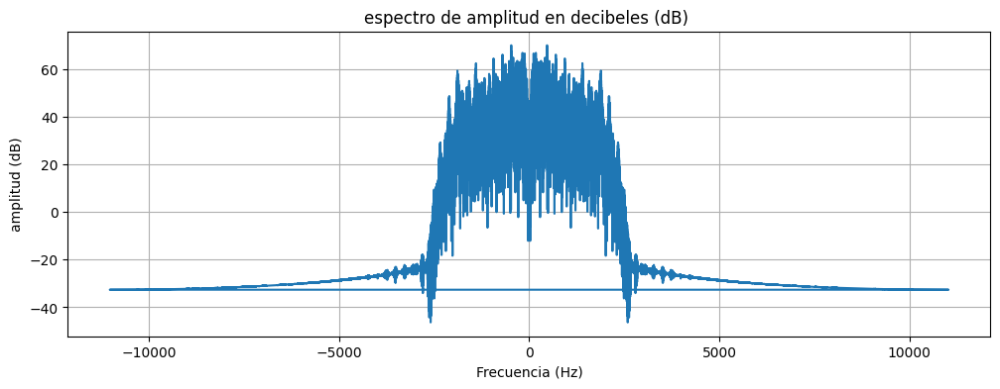

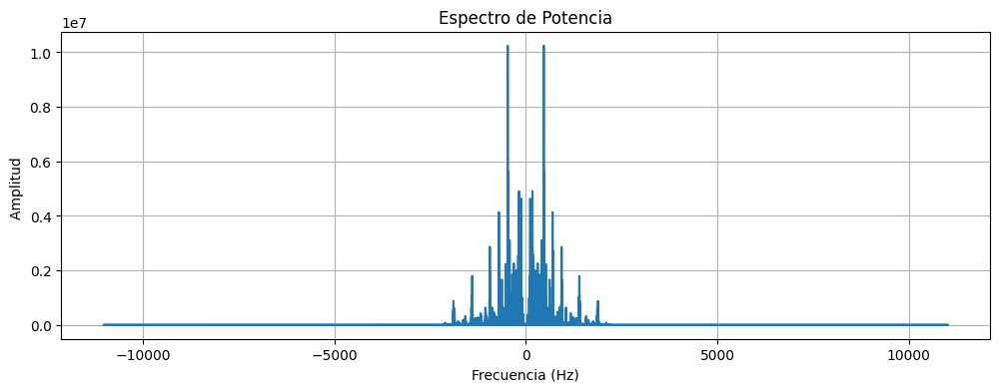

In [12]:
print(f'blackman')
grafiq2=plot_spectrum(filtered_signal2,Fs)

Flattop


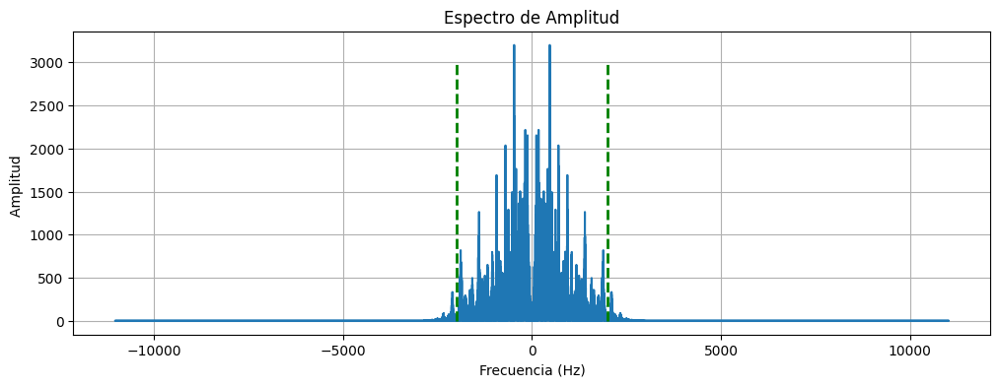

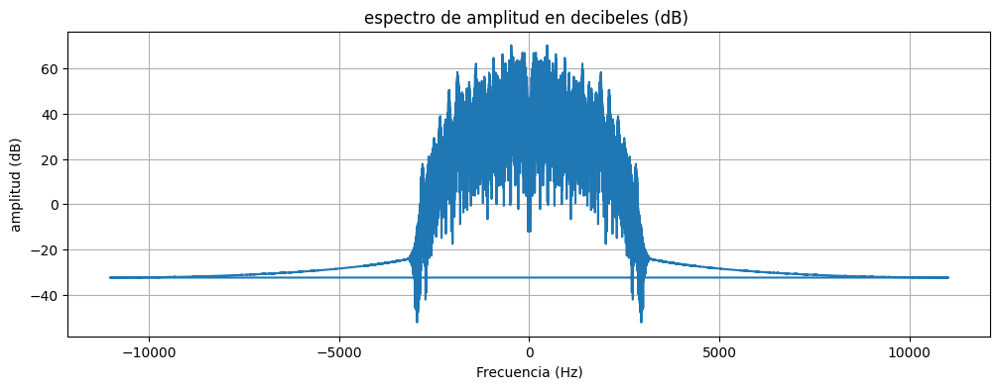

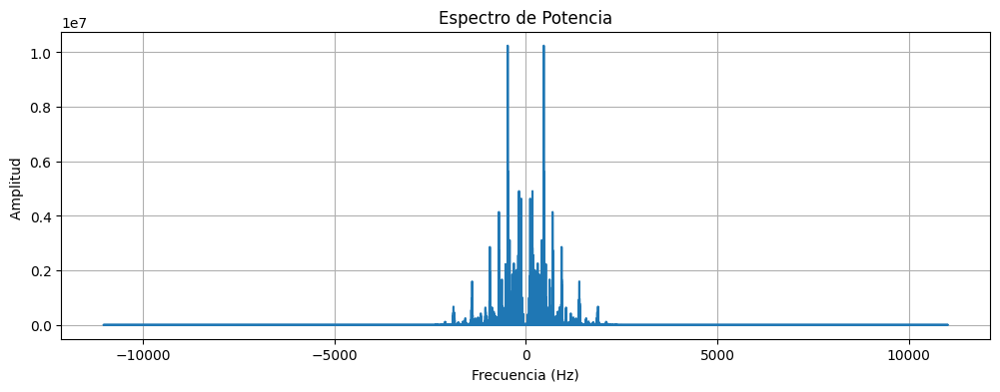

In [13]:
print(f'Flattop')
grafiq3=plot_spectrum(filtered_signal3,Fs)

## 2.1.4.	
Basándose en las gráficas: ¿Qué se puede apreciar en los diagramas de amplitud?

R//: En los diagramas de amplitud puede confirmarse que el filtro está funcionando correctamente dado que la señal comienza a atenuarse para las frecuencias mayores a la de corte; por la componente en frecuencia 0 se puede ver que no hay nivel DC en la señal, esto puede traducirse como que no hay un efecto offset en esta o un desplazamiento no deseado.
En los gráficos que toman la amplitud en medida de dB, se pueden confirmar ciertos datos que mas adelante se mostrarán en los espectrogramas, aquí se tiene que tomar en cuenta la señal en cuestión, y es que esta maneja muchos instrumentos de frecuencias graves o bajas, por lo que los cambios grandes o de valores positivos de magnitud en la escala dB tenderán a situarse más en los rangos bajos de las frecuencias y se verán un poco saturados. 

Entre los gráficos de cada ventana en la escala normal de amplitud se pueden encontrar diferencias mínimas, y es que basándonos solo en esta la ventana Hamming y blackman se denotan superiores a la Flattop ya que aun después de haber sobrepasado la frecuencia de corte (Fc=2kHz) en la Flattop se pueden visualizar mas componentes espectrales que sobrepasan este valor a comparación de las otras ventanas.

En el caso de los gráficos de la amplitud en dB, se nos da una respuesta mucho mas precisa y detallada del comportamiento de la señal con cada una de las ventanas a escala logarítmica, siendo que blackman y Flattop muestran mejores resultados en estas tanto en la precisión como en la falta de fugas espectrales.



## 2.1.5.
Grafique y escuche las señales filtradas ¿Qué cambios hubo en el audio?

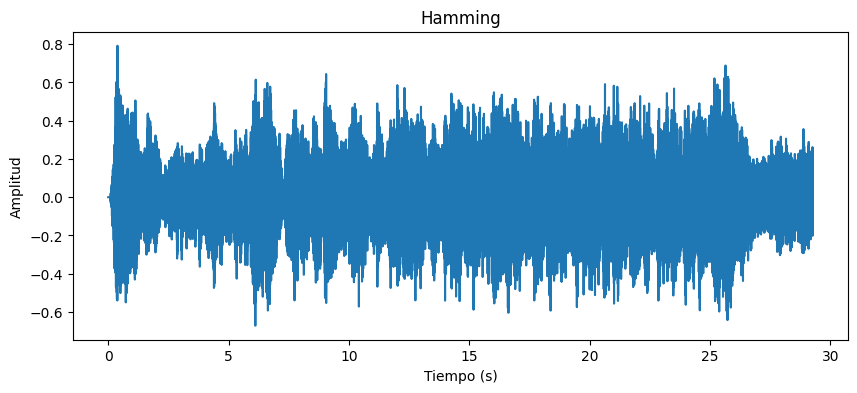

número de muestras:645248


In [14]:
duracion2 = len(filtered_signal)/Fs
tiempo2 = np.linspace(0, duracion2, len(filtered_signal)) #vector tiempo de la señal
plt.figure(figsize=(10, 4))
plt.plot(tiempo2, filtered_signal)
#el tiempo estará en términos de segundos
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title("Hamming")
plt.show()
n_muestras = len(filtered_signal)
print(f'número de muestras:{n_muestras}')

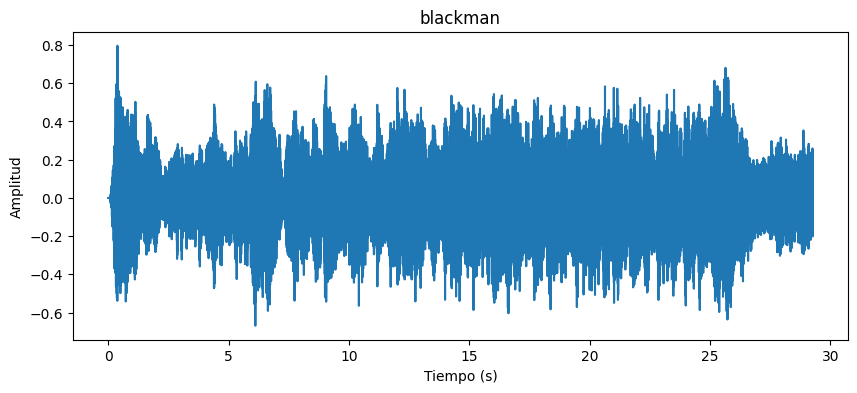

número de muestras:645248


In [15]:
duracion3 = len(filtered_signal2)/Fs
tiempo3 = np.linspace(0, duracion3, len(filtered_signal2)) #vector tiempo de la señal
plt.figure(figsize=(10, 4))
plt.plot(tiempo3, filtered_signal2)
#el tiempo estará en términos de segundos
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title("blackman")
plt.show()
n_muestras = len(filtered_signal2)
print(f'número de muestras:{n_muestras}')

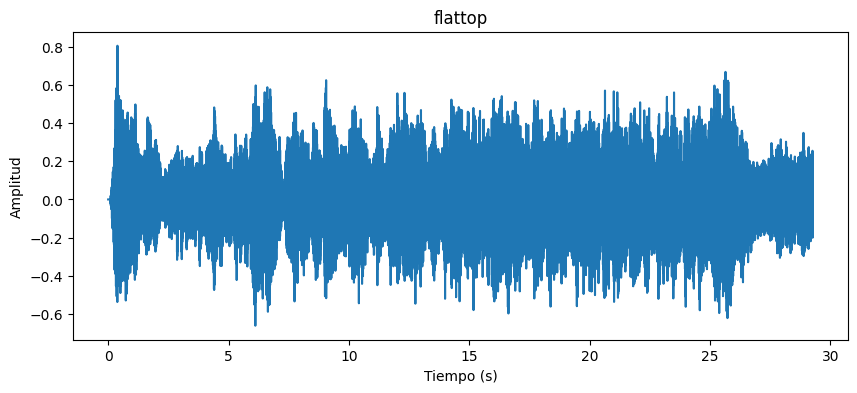

número de muestras:645248


In [16]:
duracion4 = len(filtered_signal3)/Fs
tiempo4 = np.linspace(0, duracion4, len(filtered_signal3)) #vector tiempo de la señal
plt.figure(figsize=(10, 4))
plt.plot(tiempo4, filtered_signal3)
#el tiempo estará en términos de segundos
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title("flattop")
plt.show()
n_muestras = len(filtered_signal3)
print(f'número de muestras:{n_muestras}')

In [17]:
ipd.Audio(filtered_signal, rate=Fs) #reproducir la canción

R//: Ya no se escuchan instrumentos sonidos agudos, solo se escucha parte de la canción en cuestión de manera atenuada, muy diferente a la estridente señal original.
Por otra parte no puede remarcarse una diferencia notable entre las 3 ventanas solo basándonos en el audio.

## 2.1.6.
Grafique los espectrogramas resultantes de la señal después de ser filtrada por cada una de las ventanas, compárelos y diga: ¿Qué puede inferir de estos?

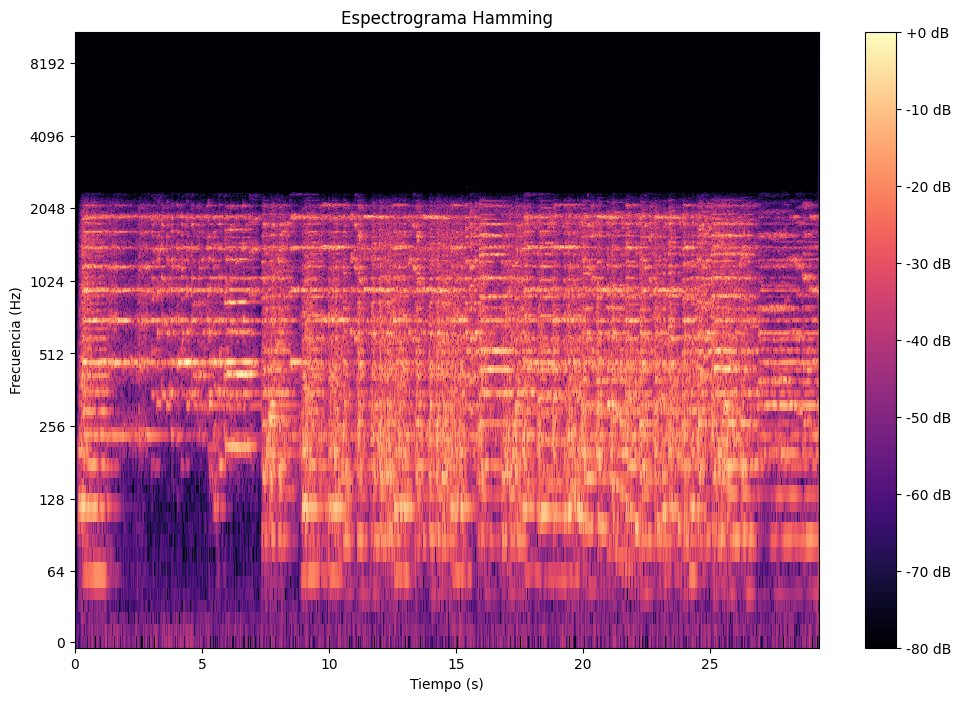

In [18]:
# Calcular espectrograma de la señal filtrada
espectrograma = librosa.stft(filtered_signal)
espectrograma_db = librosa.amplitude_to_db(np.abs(espectrograma), ref=np.max)
plt.figure(figsize=(12, 8))
librosa.display.specshow(espectrograma_db, sr=Fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma Hamming')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.show()

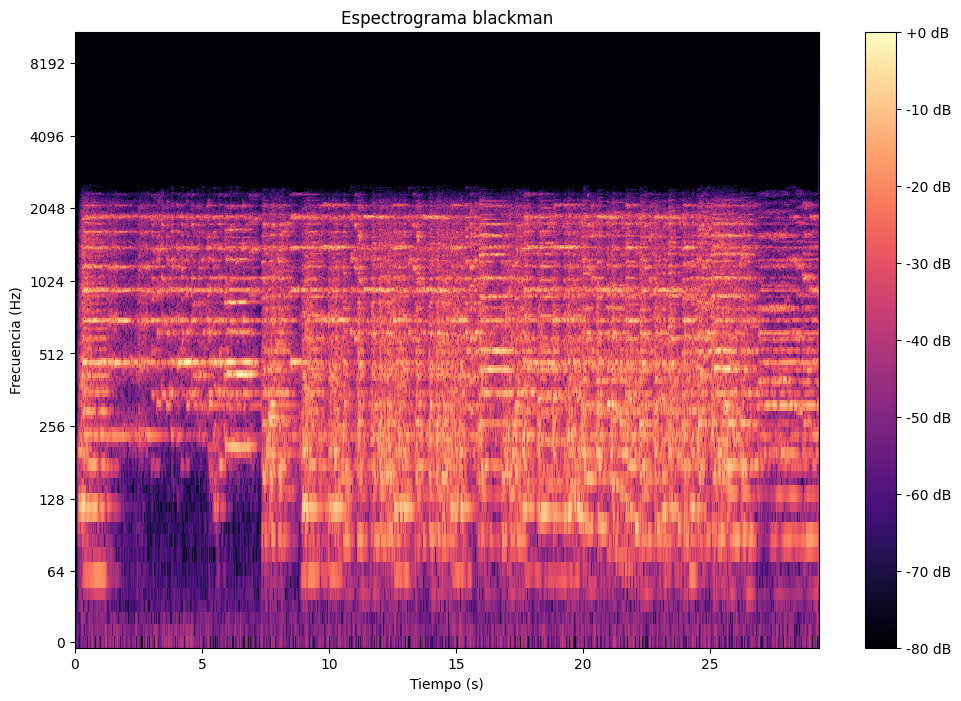

In [19]:
# Calcular espectrograma de la señal filtrada
espectrograma = librosa.stft(filtered_signal2)
espectrograma_db = librosa.amplitude_to_db(np.abs(espectrograma), ref=np.max)
plt.figure(figsize=(12, 8))
librosa.display.specshow(espectrograma_db, sr=Fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma blackman')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.show()

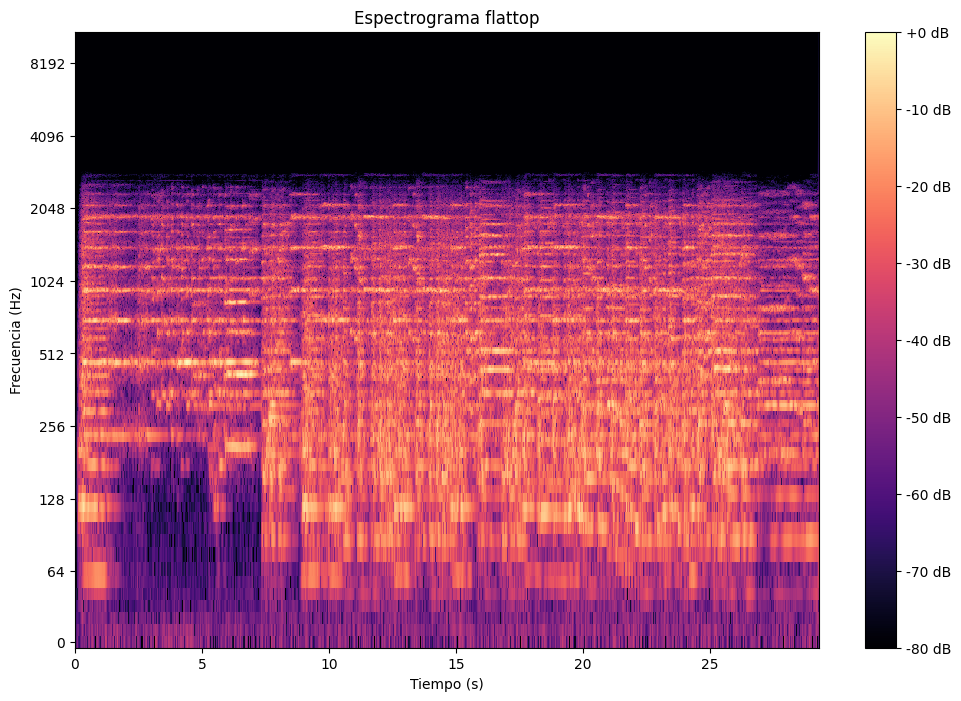

In [20]:
# Calcular espectrograma de la señal filtrada
espectrograma = librosa.stft(filtered_signal3)
espectrograma_db = librosa.amplitude_to_db(np.abs(espectrograma), ref=np.max)
plt.figure(figsize=(12, 8))
librosa.display.specshow(espectrograma_db, sr=Fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma flattop')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.show()

R//:Se pueden notar pequeñas diferencias en estos al analizar su comportamiento al sobrepasar la frecuencia de muestreo, siendo el Flattop el que tiene peor rendimiento en cuanto a esto; los espectrogramas de las ventanas Hamming y blackman presentan diferencias casi imperceptibles, pero al final la Hamming muestra un mejor filtrado.

## 2.1.7.	
¿Qué efecto se tendría en el filtrado de la señal si se modifica el ripple?

R//: El parámetro ripple está ligado a la permitividad de banda de paso que presenta el filtro, un cambio de este podría influir en un filtrado mas “brusco” y uno más “suave”; este cambio se vería reflejado sobre todo en los espectrogramas, ya que el filtro mostraría una pendiente menos pronunciada y exigente para comenzar a atenuar desde la frecuencia de corte.

## 2.1.8.
Utilice la ventana hamming y con una frecuencia de corte de 1kHz, escuche la señal y diga que cambios pueden apreciarse.

R//: El sonido de la señal se a atenuado aun mas en comparación que con la frecuencia de corte de 2kHz, ahora solo se pueden escuchar algunos instrumentos graves y des frecuencias bajas.

## 2.1.9.	
Consulte acerca de la ventana: “flattop” y diga si considera que los resultados fueron concluyentes con el funcionamiento de esta ventana.

R//: Es una ventana utilizada normalmente en el procesamiento de señales y análisis espectrales de estas; reduce en gran medida las fugas espectrales y trata de minimizar el error de amplitud en mediciones de frecuencia.
En los espectros con amplitud en dB puede verse que la ventana Flattop demuestra una mayor atenuación en cuanto a la amplitud de las componentes; consideraría que la ventana Flattop muestra resultados consistentes con lo anteriormente consultado.

In [21]:
#Ahora se utilizará una frecuencia de corte de 1kHz
Fc1=1000
window_type = 'hamming'
filtered_signal4,r4 = filtro_fir_windows(c_normalizada, Fs, Fc1, start, end, window_type)
ipd.Audio(filtered_signal4, rate=Fs) #reproducir la canción

## 2.1.10. 
Utilizando la ventana Hamming, implemente un filtro pasa-altas; filtre y escuche la señal ¿Qué puede escuchar?

R//: Ahora solo pueden escucharse instrumentos mas estridentes y de frecuencias mas altas, como las trompetas y flautas, los tambores y otros instrumentos que se podían percibir en los audios del filtro pasa-bajas son prácticamente imperceptibles. 

In [22]:
#Implementación del filtro pasa-altas.
def filtro_fir_windows_highpass(señal, fs, Fc, start_f, end_f, ventana='blackman'):
    #para cálcular el orden del filtro
    nyquist_freq = fs / 2 
    transition_width=300  # valor_ancho_banda = ancho_banda_espectral[0] librosa.feature.spectral_bandwidth(S=espectrograma, sr=frecuencia_muestreo)
    #el ancho de banda de esta cancioon diioo alrededor de 300
    #bwn=2*np.pi*(transition_width/fs) # ancho de banda normalizado en radianes
    width = transition_width/nyquist_freq
    #computar el orden y el parametro kaiser para el filtro
    N, beta = signal.kaiserord(ripple=25, width=width) # el riple nos definne la resolucion del filtro
    
    if N%2 == 0:
        N = N+1
    
    #diseño del filtro:
    normalized_Fc=Fc/nyquist_freq
    taps=signal.firwin(N , normalized_Fc, window=ventana,pass_zero="highpass")
    
    
    
    cancion_filtro = signal.convolve(señal[start_f:end_f], taps, mode='same')
    return cancion_filtro

In [23]:
Fc = 1000  # Hz
#Wc = 2*np.pi*Fc/Fs
start= 0
end=645248
window_type = 'hamming'
filtered_signal_high = filtro_fir_windows_highpass(c_normalizada, Fs, Fc, start, end, window_type)

In [24]:
ipd.Audio(filtered_signal_high, rate=Fs) #reproducir la canción

## 2.1.11.
Grafique sus espectros de amplitud y su espectrograma.

## 2.1.12.	
¿Qué puede apreciar en los espectros de amplitud?

R//: Dado que se tiene una frecuencia de corte de 1kHz, puedes verse que solo se están dejando pasar las frecuencias mayores a este valor y dado a las características propias de la señal o canción que estamos filtrando, se muestra una gran cantidad de frecuencias altas pertenecientes a instrumentos de percusión estridentes.

Hamming


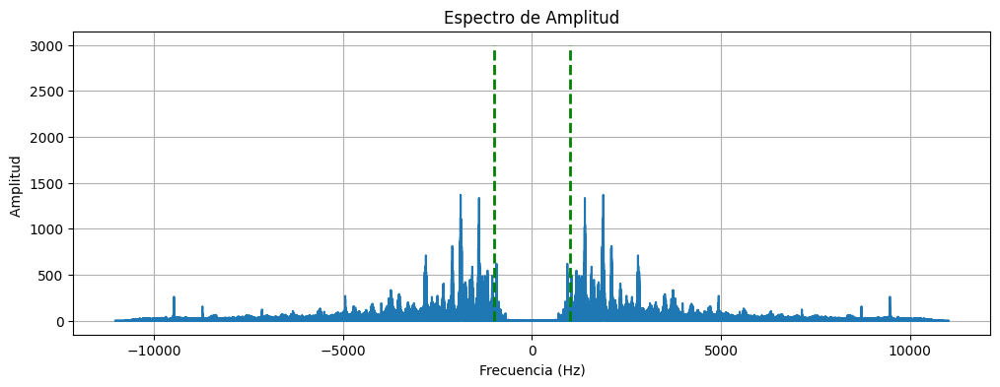

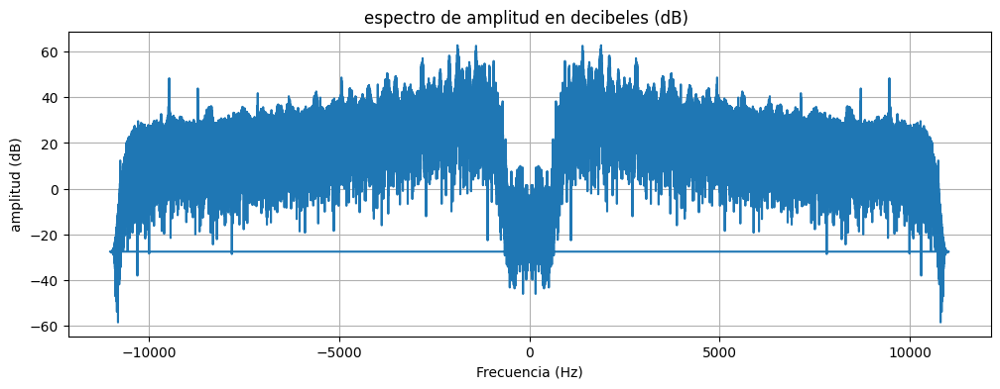

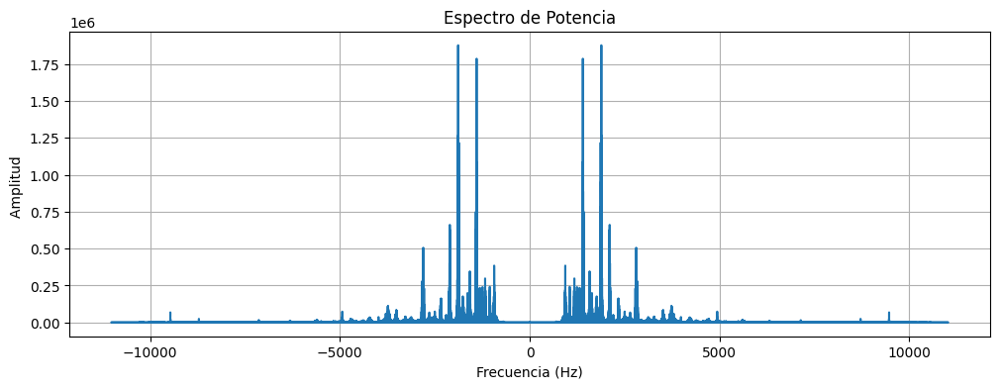

In [25]:
print(f'Hamming')
grafiq3=plot_spectrum(filtered_signal_high,Fs)

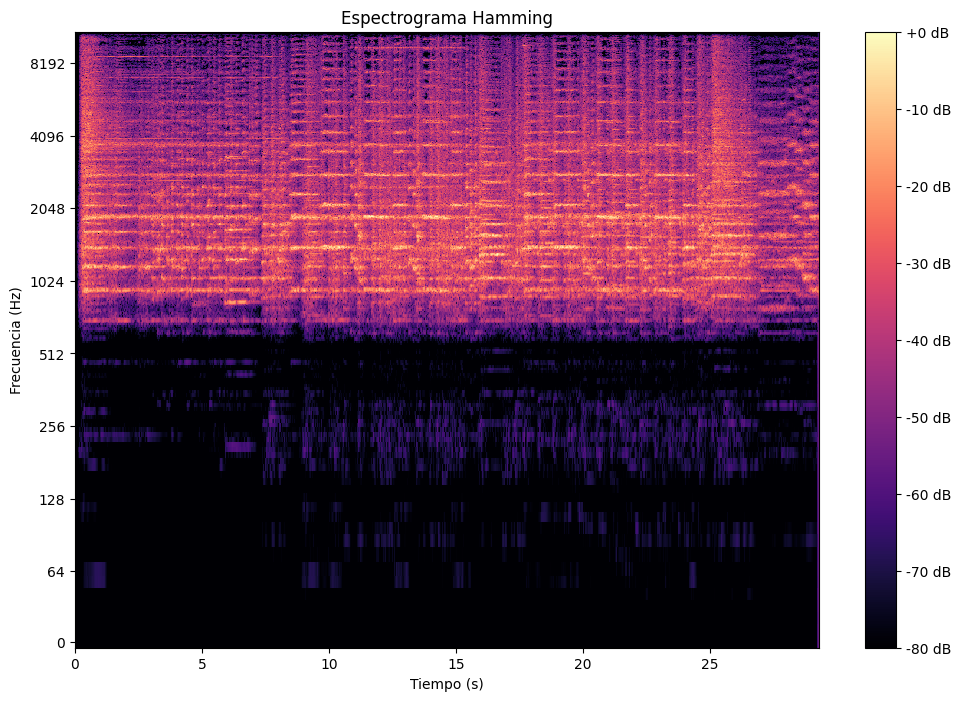

In [26]:
# Calcular espectrograma de la señal filtrada
espectrograma = librosa.stft(filtered_signal_high)
espectrograma_db = librosa.amplitude_to_db(np.abs(espectrograma), ref=np.max)
plt.figure(figsize=(12, 8))
librosa.display.specshow(espectrograma_db, sr=Fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma Hamming')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.show()

# 3.Diseño de Filtros con Respuesta Infinita al Impulso (IIR)

## 3.1.1.
Diseñe un filtro IIR pasa-bajas de tipo Butterworth, con una frecuencia de corte de 2kHz en un rango de su preferencia.

## 3.1.2.
Escuche la señal filtrada; en comparación con el filtor pasa-bajas FIR ¿encuentra alguna diferencia en el audio?

R//: Realmente no se escucha ninguna diferencia resaltante en el audio con respecto al resultado obtenido del filtro anterior, ambos se escuchan igualmente atenuados y no cuentan con instrumentos de frecuencias altas.

In [27]:
def filtro_irr_windows(señal, fs, Fc, start_f, end_f, tipo='lowpass'):
    
    nyquist_rate=fs/2
    Ancho=Fc/nyquist_rate
    b, a = signal.butter(6, Ancho, btype=tipo, analog=False, output='ba', fs=None)# genera numerador y el demonominador del filtro irr
    cancion_filtro = signal.lfilter(b, a, señal[start_f:end_f])#filtra

    return cancion_filtro

In [28]:
Fc = 2000  # Hz
start= 0
end=645248
filtered_signal_iir = filtro_irr_windows(c_normalizada, Fs, Fc, start, end)

In [29]:
ipd.Audio(filtered_signal_iir, rate=Fs) #reproducir la canción

## 3.1.3
Grafique los espectros de amplitud y potencia de la señal filtrada, en comparación con el filtro FIR anteriormente implementado ¿Qué puede resaltar?

R//: En estos gráficos también se puede observar la falta de nivel DC, las mayores diferencias que se pueden resaltar con respecto a los diagramas del filtro anterior es la efectividad al filtrar ya que varias componentes frecuenciales con amplitudes considerables siguen siendo visibles aun después de la frecuencia de corte, y aunque se van atenuando se resalta que lo hacen de manera mas pausada o “lenta” a comparación con el filtro FIR.

Flattop


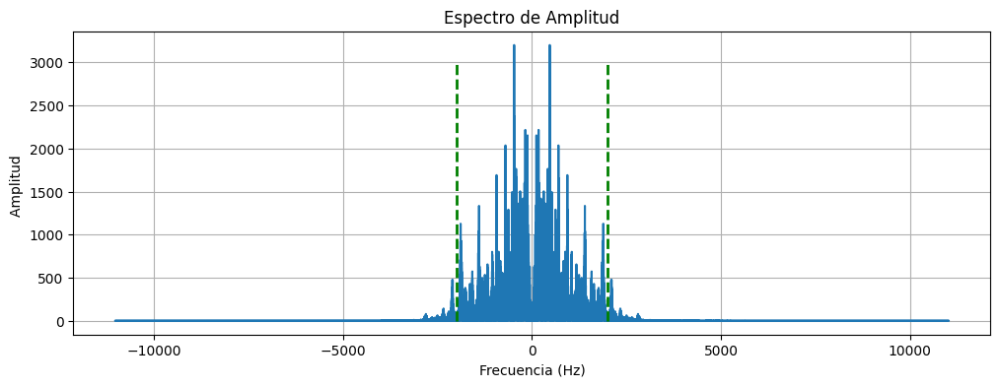

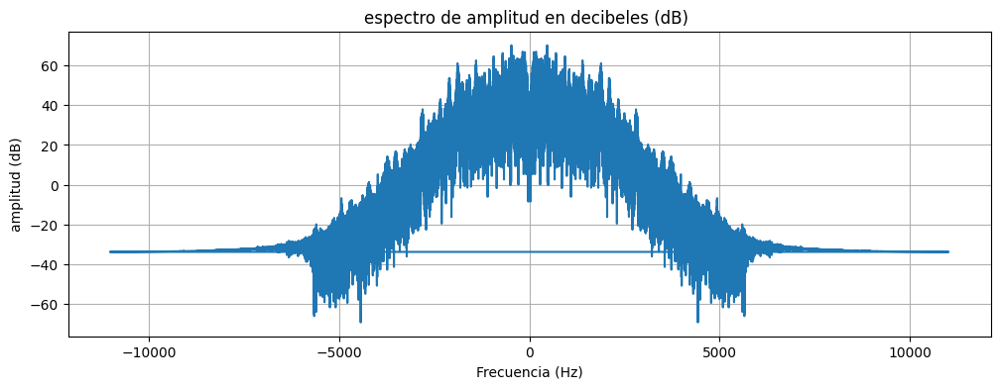

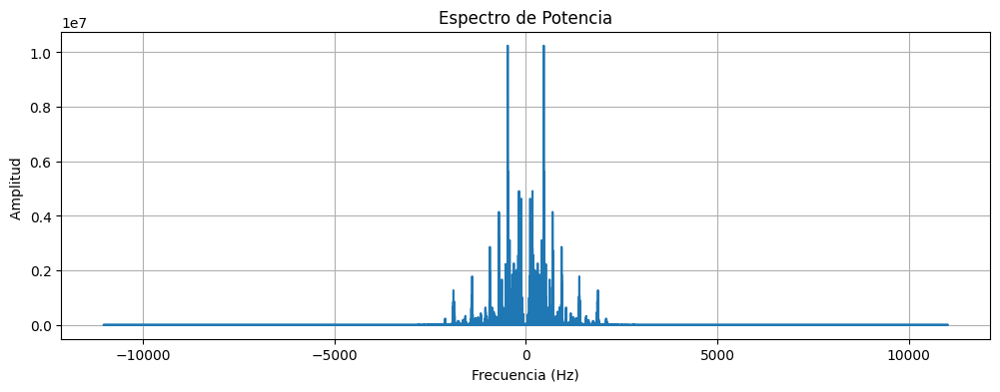

In [30]:
print(f'Flattop')
grafiq3=plot_spectrum(filtered_signal_iir,Fs)

## 3.1.4
Grafique el espectrograma de la señal resultante, teniendo en cuenta los resultados vistos en la gráfica del espectro de amplitud ¿Qué puede decir de este?

R//: En el espectrograma puede confirmarse de manera mas clara como el filtro tarda en “suavizar” la señal incluso después de sobrepasada la frecuencia de corte, tenemos que tener en cuenta que los filtros IIR cuentan con una transición suave entre bandas de frecuencia y utilizan menos coeficientes que un filtro FIR, por lo que se muestran algunas frecuencias bajas con respecto a las de corte graficadas, aunque son insignificantes.

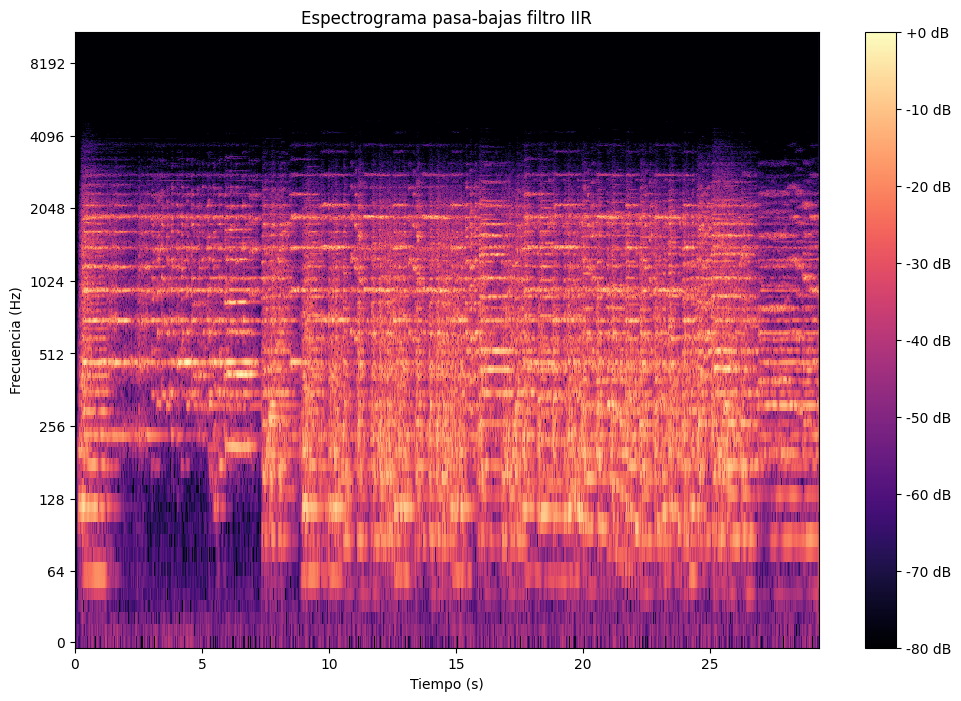

In [31]:
# Calcular espectrograma de la señal filtrada
espectrograma = librosa.stft(filtered_signal_iir)
espectrograma_db = librosa.amplitude_to_db(np.abs(espectrograma), ref=np.max)
plt.figure(figsize=(12, 8))
librosa.display.specshow(espectrograma_db, sr=Fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma pasa-bajas filtro IIR')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.show()


## 3.1.5.
Por medio de un filtro pasa-bandas intente separar uno de los instrumentos presentes en el audio que escogió, consulte las frecuencias correspondientes de este instrumento y diga si fue posible separarlo.

R//: El instrumento escogido fueron las trompetas, hay que tener en cuenta que existen variantes de este instrumento, pero las comúnmente utilizadas para bandas o sinfonías son las Si bemol cuya escala en frecuencia se encuentra entre 261 Hz a 1046 Hz, este es un rango de frecuencia en el cual también pueden inmiscuirse el de otros instrumentos tales como el trombón (130Hz a 880Hz), la flauta (131Hz a 523Hz), etc; en resumen, no se logró separar la trompeta completamente, solo se logró eximir los instrumentos cuyo sonido no llega al rango de frecuencia impuesto.

In [32]:
#Filtro pasa-banda
def filtro_irr_windows_pasa_banda(señal, fs, Fci ,Fcs , start_f, end_f, tipo='lowpass'):
    
    nyquist_rate=fs/2
    Ancho=[Fci/nyquist_rate,Fcs/nyquist_rate]
    b, a = signal.butter(6, Ancho, btype=tipo, analog=False, output='ba', fs=None)# genera numerador y el demonominador del filtro irr
    cancion_filtro = signal.lfilter(b, a, señal[start_f:end_f])#filtra

    return cancion_filtro

In [33]:
Fci = 261  # Hz
Fcs = 1046  # Hz
start= 0
end=645248
filtered_signal_trompeta = filtro_irr_windows_pasa_banda(c_normalizada, Fs, Fci, Fcs, start, end, tipo = 'bandpass')

In [34]:
ipd.Audio(filtered_signal_trompeta, rate=Fs) #reproducir la canción

## 3.1.6.
Grafique el espectrograma de la señal resultante.

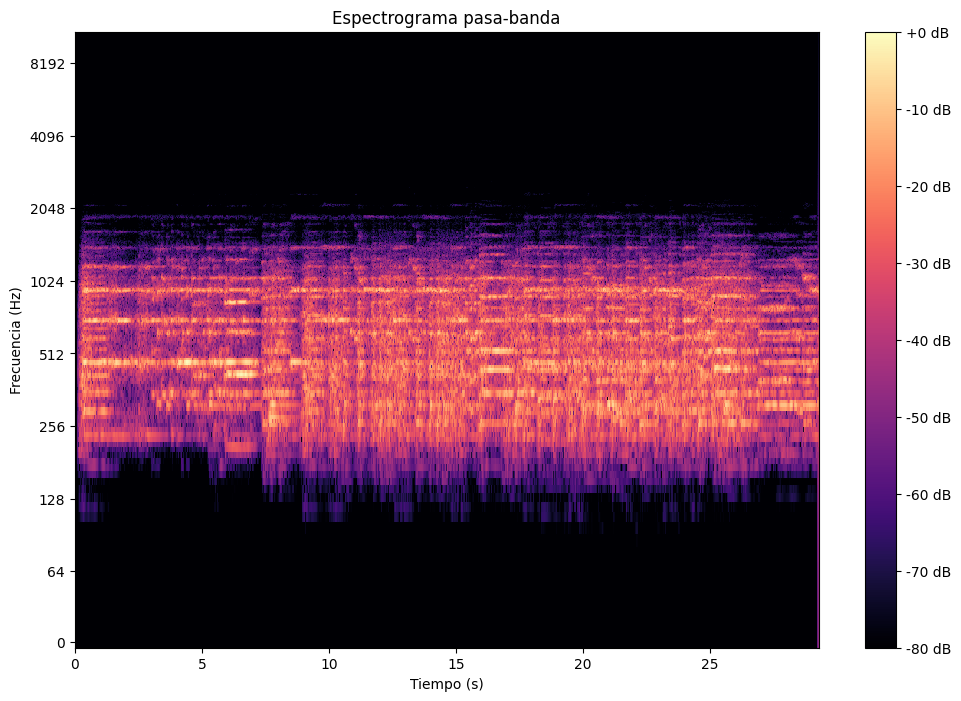

In [35]:
# Calcular espectrograma de la señal filtrada
espectrograma = librosa.stft(filtered_signal_trompeta)
espectrograma_db = librosa.amplitude_to_db(np.abs(espectrograma), ref=np.max)
plt.figure(figsize=(12, 8))
librosa.display.specshow(espectrograma_db, sr=Fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma pasa-banda')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.show()

# 4.Aplicación filtro de distorsión.

In [36]:
def filtro_distorcion(señal_entrada, inicio, final, gain=1.0):
    # Aplicar el filtro de distorsión utilizando la función wave
    distorted_signal = np.copy(señal_entrada)
    distorted_range = distorted_signal[inicio:final]
    distorted_range = np.tanh(distorted_range * gain) #la tanh aplica distorción no lineal a las señal.
    distorted_signal[inicio:final] = distorted_range

    return distorted_signal

## 4.2.1.	
Tome la señal anteriormente filtrada con la ventana hamming de los filtros FIR y aplique el filtro de distorsión.

In [37]:
señal_dis = filtered_signal
inicio=0
final=645248
recover_signal = filtro_distorcion(señal_dis, inicio, final, gain=8.0) #gain va a controlar la cantidad de distorción que se va a aplicar

## 4.2.2.	
Grafique el espectrograma de la señal filtrada y escúchela, ¿Qué diferencias encuentra con respecto a los resultados del filtro anterior?

R//: En el espectrograma pueden notarse menos definidas las divisiones de colores y un paso más notorio de frecuencias que sobrepasan la anterior frecuencia de corte con la que trabaja el filtro FIR (2kHz); el audio confirma lo visto en el espectrograma, ya que ahora el sonido presenta una gran distorsión a medida que avanza el audio, los instrumentos son menos diferenciables, aunque aún puede notarse que es la misma canción.

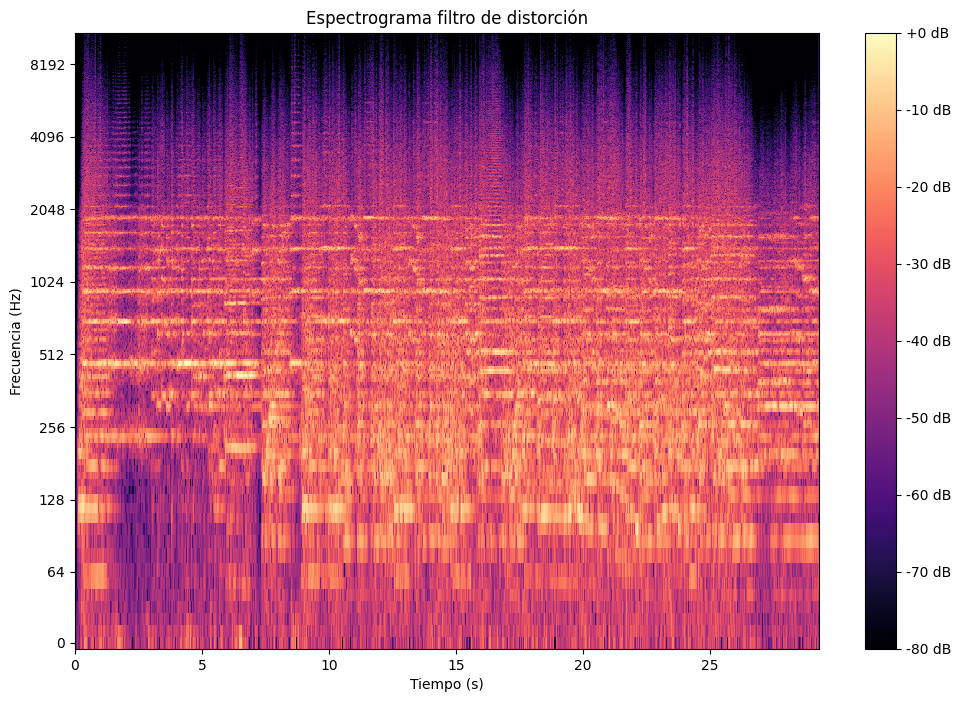

In [38]:
espectrograma_dist = librosa.stft(recover_signal)
espectrograma_db_dist = librosa.amplitude_to_db(np.abs(espectrograma_dist), ref=np.max)
plt.figure(figsize=(12, 8))
librosa.display.specshow(espectrograma_db_dist, sr=Fs, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Espectrograma filtro de distorción')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.show()

In [39]:
ipd.Audio(recover_signal, rate=Fs) #reproducir la canción

## 5.	Conclusiones:



1. Teniendo en cuenta lo que se puede observar en los espectros y en los diagramas de amplitud, el filtro FIR debe considerarse la mejor opción para filtrar la señal en este caso, dado que se tiene una respuesta mas definida que se ajusta de mejor manera a la frecuencia de corte establecida; los filtros FIR proporcionan mayor estabilidad que los filtros IIR, aunque requiera de un mayor uso de recursos computacionales. Con el filtro FIR se logra una mejor respuesta en frecuencia lineal por lo que se puede hacer un filtrado controlado y preciso.

2. A través del filtro FIR por método de ventaneo, se pudo ver la importancia y las implicaciones del ripple sobre el filtro; el ripple influye directamente en el factor de atenuación del filtro. La respuesta de amplitud de banda de paso del filtro determina la cantidad de atenuación que se va a permitir, al igual que tiene un gran impacto en los recursos computacionales. Un valor de ripple bajo permite una menor cantidad de atenuación y la supresión de frecuencias no deseadas.

3. Con el filtro del pasa-bandas se tiene que tomar en cuenta que estos filtros están diseñados con el objetivo de permitír el paso de un rango específico de frecuencias mientras que atenua o directamente bloquea las frecuencias fuera de la banda dada; para la señal en cuestión se investigó la frecuencia en la que normalmente se encuentran los sonidos de las trompetas, mas sin embargo, eso no significa que solo se podrá escuchar este instrumento en la señal filtrada, todo sonido con una frecuencia existente dentro del rango de banda podrá pasar por el filtro y dado que trabajamos con la señal de una orquesta resulta casi imposible el separar uno solo de los instrumentos.

4. El normalizar la señal redujo considerablemente la dependencia que se tendría con respecto a la amplitud de la señal en cuestión, ya que, al trabajar en un rango de entre -1 y 1 se pudo facilitar el análisis de la señal.

5. en algunas señales se puede notar un efecto como de "eco" o una sensación de "espacio", esto es un efecto de reverberación y puede estár presente por características mismas de la señal por como fue grabada, es un efecto que se muestra príncipalmente en grabaciones de música.